Matthieu de Castelbajac  
Hakim Amraoui

# Practical work 8: Split and Merge

In this practical work, we implement and test the split and merge algorithm.

In [40]:
### Usefull libraries
from PIL import Image
import numpy as np
from scipy.signal import convolve2d
import matplotlib.pyplot as plt

### Data
img_test = np.full((64,64),150,dtype=np.uint8)
img_test[32:48,16:16+32] = 100
img_test[8:24,40:56] = 50
angio = np.array(Image.open('img/angiogra.png'))
cam = np.array(Image.open('img/cameraman.png'))
muscle = np.array(Image.open('img/muscle.png'))
prisme = np.array(Image.open('img/prisme.png'))
seiche = np.array(Image.open('img/seiche.png'))

### Usefull functions
def neighbors(b,K):
    """ blockStat*list[blockStat]->list[blockStat]
        returns the list of neighbors of b and elements of K 
    """
    def belongsTo(x,y,a):
        """ int*int*BlockStat -> bool 
            Test if pixel (x,y) belongs to block a 
        """
        return x>=a[0] and y>=a[1] and x<a[0]+a[2] and y<a[1]+a[3]
    def areNeighbors(a,b):
        """ BlockStat**2 -> bool
            Test if a and b are neighbors
        """
        if a[2]>b[2] and a[3]>b[3]:
            a,b=b,a
        x,y = a[0]+a[2]//2,a[1]+a[3]//2
        return belongsTo(x+a[2],y,b) or belongsTo(x-a[2],y,b) or belongsTo(x,y+a[3],b) or belongsTo(x,y-a[3],b)
    N = []
    for n in K:
        if areNeighbors(b,n):
            N.append(n)
    return N


def imshow(I,title=None):
    """ display an image """
    plt.figure(figsize=(500//80,500//80))
    plt.gray()
    plt.imshow(I)
    if title: plt.title(title)
    plt.show()
    
def thresholdImage(I,s):
    """ Array*int -> Array """
    return np.where(I<s, 0, 255)

def SobelDetector(I, s):
    """ Array*double -> Array """
    Sx = np.array([[1, 0, -1], 
                   [2, 0, -2], 
                   [1, 0, -1]])
    Sy = np.array([[1, 2, 1], 
                   [0, 0, 0], 
                   [-1, -2, -1]])
    
    Ix = convolve2d(I, Sx, mode='same')
    Iy = convolve2d(I, Sy, mode='same')
    
    norm = np.sqrt( Ix**2 + Iy ** 2)
    
    return thresholdImage(norm, s)

## Exercise 1

### Question 1
Write the recursive function ``split()`` discussed in tutorial work. 
It takes as input the image, a region, a predicate, and a variable number of arguments. 
The region is a Python formal type ``Block`` defined by:
```python
type Block = tuple[int**4]
```
The function ``split()`` returns a quadtree, a Python formal type, recursivelly defined by:
```python
type QuadTree = list[(QuadTree**4|Block)] 
```

The predicate is a Python function with the following signature:
```python
Array*Block*...->bool
```
It can take a variable number of parameters which correspond to the parameters required by the predicate.

In [41]:
# type Block = tuple[int**4]
# type QuadTree = list[(QuadTree**4|Block)] 

def predsplit(I, R, s):
    x, y, n, m = R

    sigma = np.std(I[x : x + n, y : y + m])
    return sigma > s

def split(I, R, s, *args):
    """ Array*Block*(Array*Block*...->bool)*... -> 4-aire
        Performs a quadtree splitting of image I drived by a predicate
    """
    qt = (None, None, None, None, R)
    x, y, n, m = R
    if predsplit(I, R, s) and n > 2 and m > 2:
        return[split(I, (x, y, n//2, m//2), s, *args),
        split(I, (x, y + m // 2, n//2, m//2), s, *args),
        split(I, (x + n // 2, y, n//2, m//2), s, *args),
        split(I, (x + n // 2, y + m // 2, n//2, m//2), s, *args)]
        
    else: return [R]
    

In [42]:
# For now we'll set the threshold s at 1e-2
s = 1e-2

### Question 2
Write the function ```predsplit(I,B,*args)``` with signature:
```python
Array*Block*... -> bool
```
that returns True if the standard deviation of image ``I`` computed in region ``B`` is greater than the first value of argument ``*args`` (it can be accessed simply by ``*args[0]``).

In [4]:
# def predsplit(I,reg,*args):
#     """ Array*Block*... -> bool
#     """ 
   

***Voir fonction au dessus***

### Question 3
Write the function ``listRegions()`` which applies a depth-first search on the quadtree given as parameter, and returns the list of the leaves of the quadtree. 

Some recalls about lists in Python;
 - Initialization: `L = []` (empty list)
 - Add a element `a` into a list `L`: `L.append(a)`

In [43]:
def listRegions(Lqt):
    """ QuadTree -> list[Block]
    """
    L = []
    if len(Lqt) == 1:
        return(Lqt)
    else:
        for node in Lqt:
            L += listRegions(node)
    return L
    

### Question 4
Test your codes on the synthetic image ``img_test`` seen in tutorial work. Print the value returned by ``split()`` as well as the one returned by ``listRegions()``. 

In [6]:
R = (0, 0, img_test.shape[0], img_test.shape[1])
splited_image = split(img_test, R, s)

In [7]:
LL = listRegions(splited_image)
print(LL)

[(0, 0, 32, 32), (0, 32, 8, 8), (0, 40, 8, 8), (8, 32, 8, 8), (8, 40, 8, 8), (0, 48, 8, 8), (0, 56, 8, 8), (8, 48, 8, 8), (8, 56, 8, 8), (16, 32, 8, 8), (16, 40, 8, 8), (24, 32, 8, 8), (24, 40, 8, 8), (16, 48, 8, 8), (16, 56, 8, 8), (24, 48, 8, 8), (24, 56, 8, 8), (32, 0, 16, 16), (32, 16, 16, 16), (48, 0, 16, 16), (48, 16, 16, 16), (32, 32, 16, 16), (32, 48, 16, 16), (48, 32, 16, 16), (48, 48, 16, 16)]


### Question 5
Write the function ```drawRegions(L,I)``` which takes as arguments a list of regions, an image, and returns an image  where the boundaries of each region have been traced with red color. Indication: the returned image is a hypermatrix of dimension 3, the third dimension is of size 3 and encodes the red, green and blue components of a RGB colorspace. Test the function on the previous example.

In [44]:
def drawRegions(LL,I):
    """ list[Block]*Array -> Array
        parcours de la liste dessin des régions 
    """
    Ires = np.dstack((I, I, I))
    
    for r in LL:
        x, y, n, m = r
        Ires[x:(x+n),y,0] = 255
        Ires[x,y:(y+m),0] = 255
    
    return Ires

In [9]:
img_red_lines = drawRegions(LL, img_test)

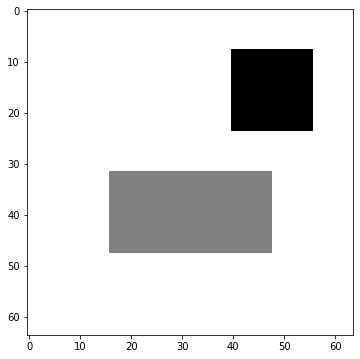

In [10]:
imshow(img_test)

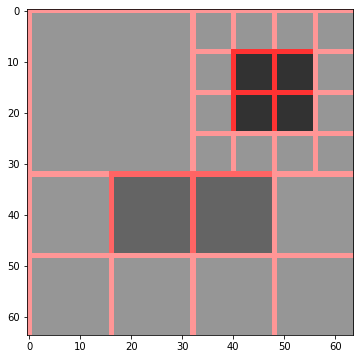

In [11]:
imshow(img_red_lines)

### Question 6
Add a Gaussian noise with standard deviation 5 to the image ``img_test``. 
Apply the quadtree splitting on the noisy image by adjusting the threshold to obtain the same result as in the previous question. 
Which threshold value should be chosen? Does this make sense to you?

Hint: use the Numpy function ``random.randn()`` which generates random values according to a normal distribution (Gaussian distribution of null mean and variance 1). To obtain realizations of a Gaussian distribution of standard deviation $\sigma$, it is sufficient to multiply by $\sigma$ the realizations of a normal distribution. 

In [45]:
from numpy import random

def addGaussianNoise(I, mean, sigma):
    gaussianNoise = np.random.normal(mean, sigma, I.shape)
    return (I+gaussianNoise).astype(int)

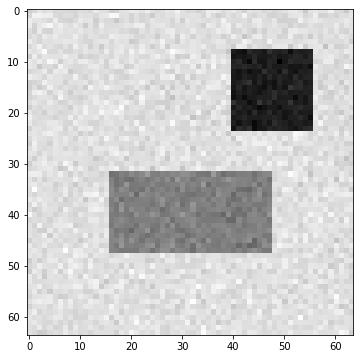

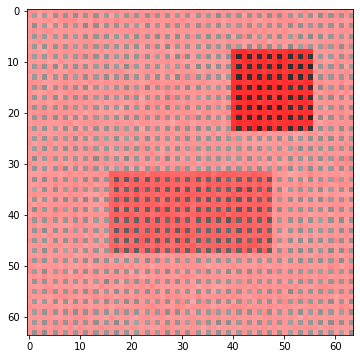

In [13]:
noisyTest = addGaussianNoise(img_test, 0, 5)
imshow(noisyTest)

R = (0, 0, noisyTest.shape[0], noisyTest.shape[1])
splitNoisyTest = split(noisyTest, R, s)
LLNoisy = listRegions(splitNoisyTest)
imshow(drawRegions(LLNoisy, noisyTest))

**It appears with our threshold $s = 0,01$ that the predicate is too sensitive to the gaussian noise.**  
**Let's try with higher threshold values :**

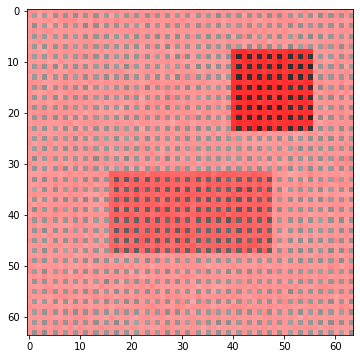

0.0


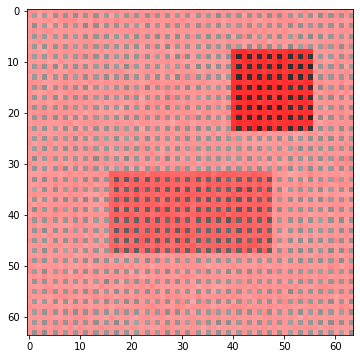

0.1


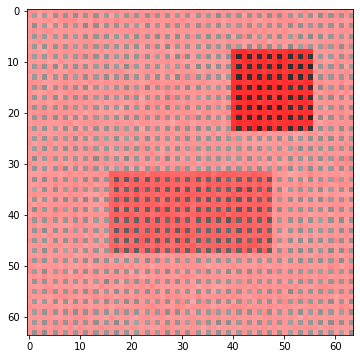

0.2


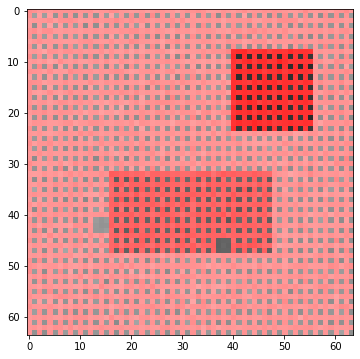

0.3


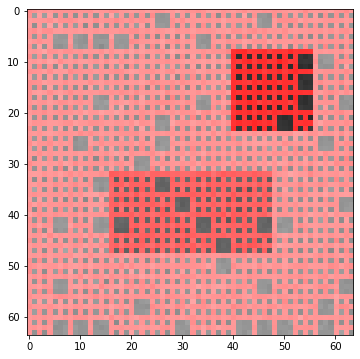

0.4


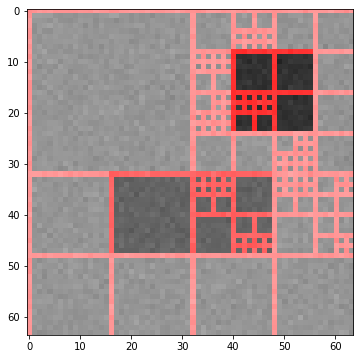

0.5


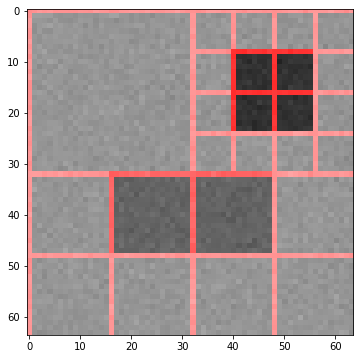

0.6


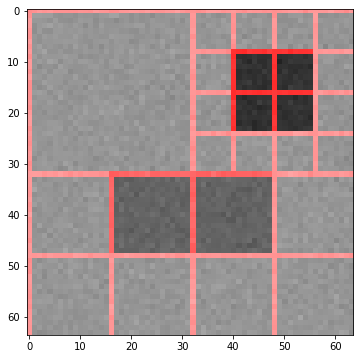

0.7


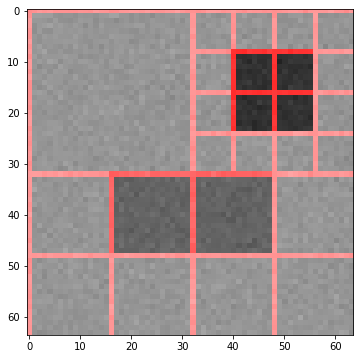

0.8


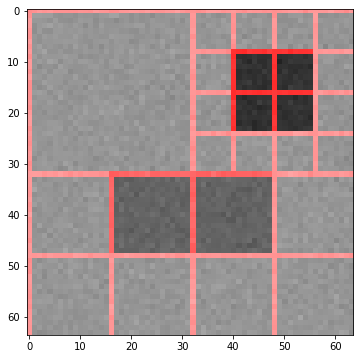

0.9


In [14]:
for i in range(10):
    splitNoisyTest = split(noisyTest, R, i)
    LLNoisy = listRegions(splitNoisyTest)
    imshow(drawRegions(LLNoisy, noisyTest))
    print(i/10)

**We can have so good results for a threshold greater than $0.5$, although this test image is fairly simple**  
**Thus we'll do more testing with more complex pictures down below**

## Exercise 2

Experiment the split algorithm on the 4 natural images provided. For each image try to find the threshold that seems to you visually the best. Display the number of regions obtained after splitting.

**We want the threshold to be low enough to discriminate the defining structures in these images, but not so low that the splitting algorithm takes too much into account small variations within these structures.  
For each image, we'll test threshold of various values and conclude on what estimated range of values is best for each image.**

In [46]:
def thresholdTest(I):
    R=(0,0,I.shape[0], I.shape[1])
    s = 100
    while s > 1:
        splitI = split(I, R, s)
        LL = listRegions(splitI)
        imshow(drawRegions(LL, I))
        print('Threshold : ', s)
        print('Number of regions : ', len(LL))
        s/=2
    return

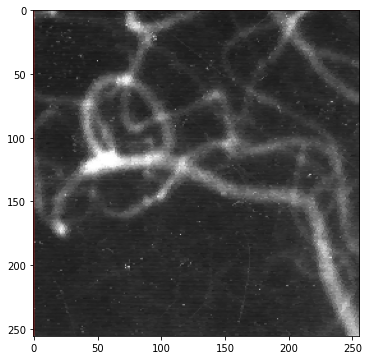

Threshold :  100
Number of regions :  1


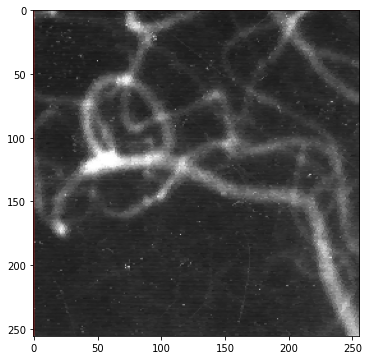

Threshold :  50.0
Number of regions :  1


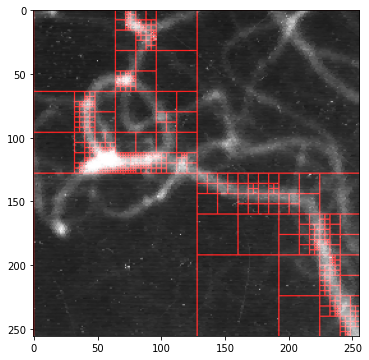

Threshold :  25.0
Number of regions :  517


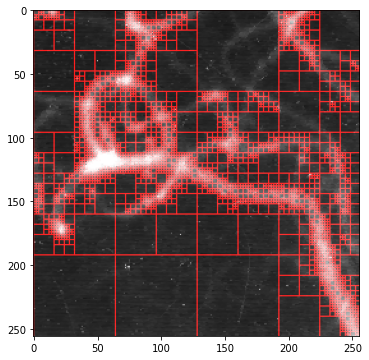

Threshold :  12.5
Number of regions :  3061


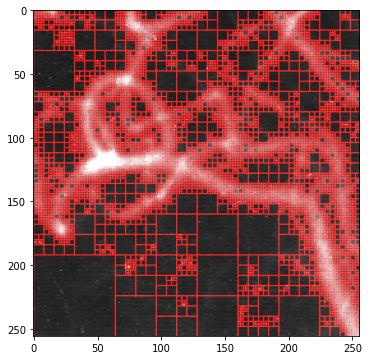

Threshold :  6.25
Number of regions :  6763


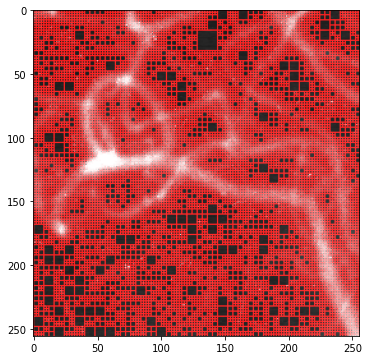

Threshold :  3.125
Number of regions :  12493


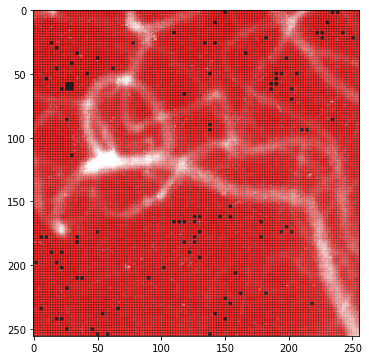

Threshold :  1.5625
Number of regions :  16063


In [56]:
# angio
thresholdTest(angio)

**To capture all the details, threshold should be in the range [ $6, 12$ ]**

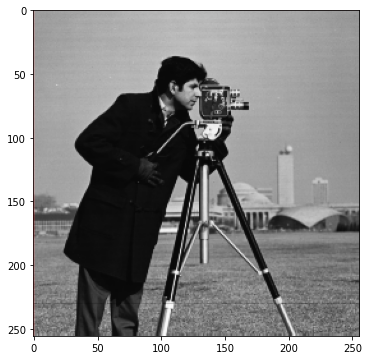

Threshold :  100
Number of regions :  1


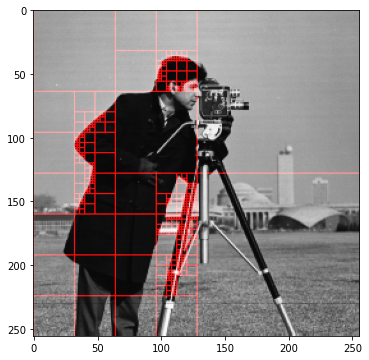

Threshold :  50.0
Number of regions :  469


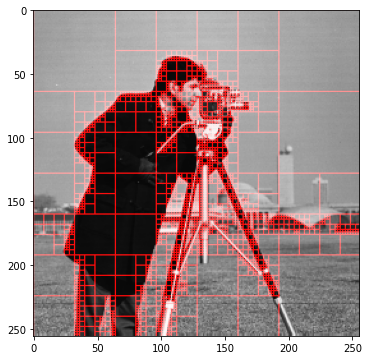

Threshold :  25.0
Number of regions :  2446


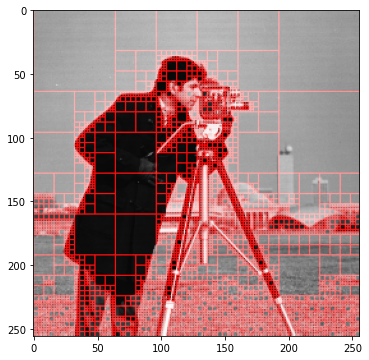

Threshold :  12.5
Number of regions :  4996


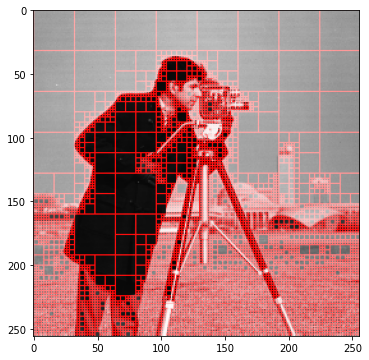

Threshold :  6.25
Number of regions :  6958


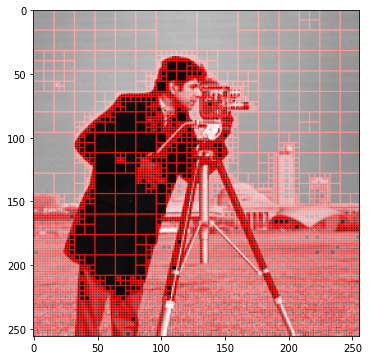

Threshold :  3.125
Number of regions :  7900


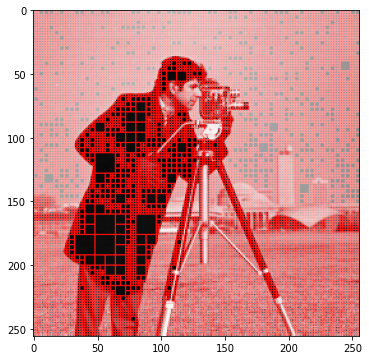

Threshold :  1.5625
Number of regions :  13747


In [57]:
# camO
thresholdTest(cam)

**In this one it gets trickier : it all depends on what we want to discriminate or not.**  
If we only want the silouhette, then no need to go below 25.  
If we want the buildings in the background tho, we need the threshold to be at least below 12.5, but then the algorithm starts to discriminate blades of grass, which we might want to avoid as it leads to heavier merging in the next steps.

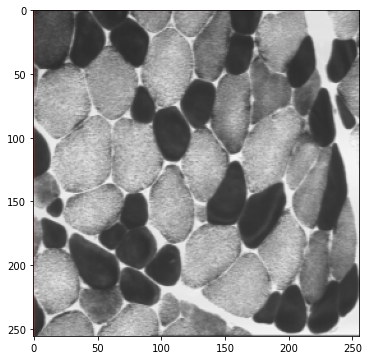

Threshold :  100
Number of regions :  1


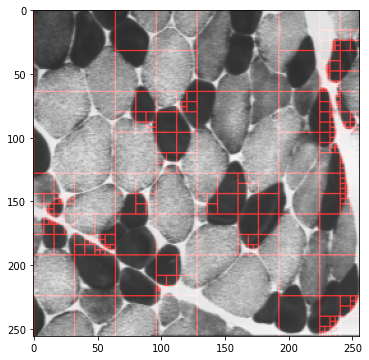

Threshold :  50.0
Number of regions :  409


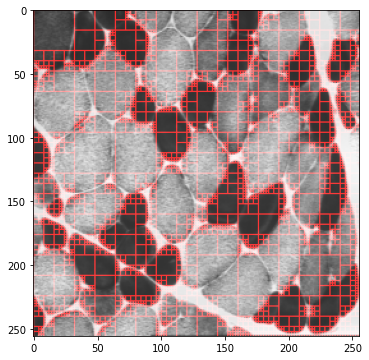

Threshold :  25.0
Number of regions :  3091


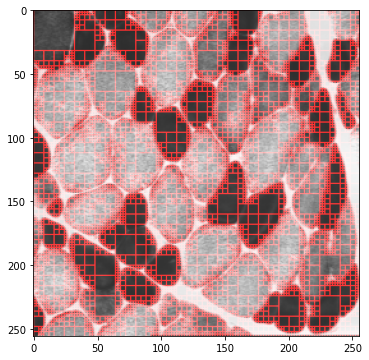

Threshold :  12.5
Number of regions :  7120


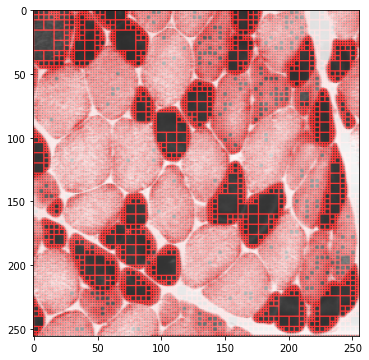

Threshold :  6.25
Number of regions :  12478


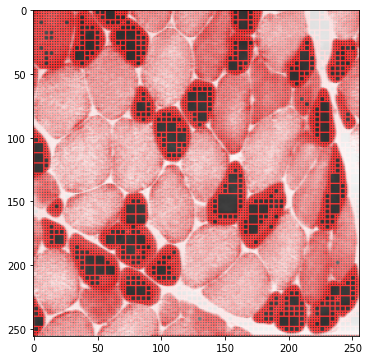

Threshold :  3.125
Number of regions :  13954


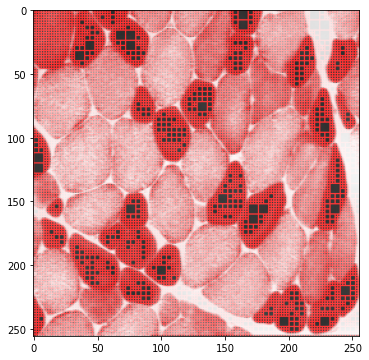

Threshold :  1.5625
Number of regions :  14902


In [58]:
# muscle
thresholdTest(muscle)

**Threshold should be at most 25, although we can notice here how poorly the square splitting fits rounded shapes. We might be more precise with triangular splits.**

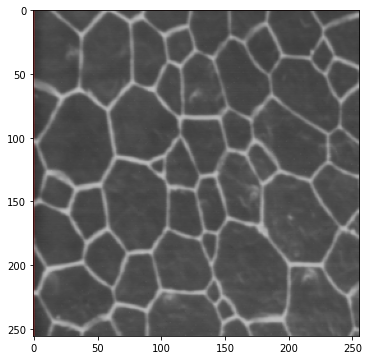

Threshold :  100
Number of regions :  1


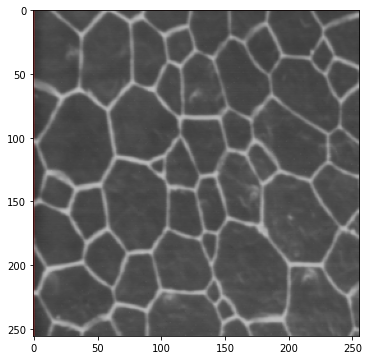

Threshold :  50.0
Number of regions :  1


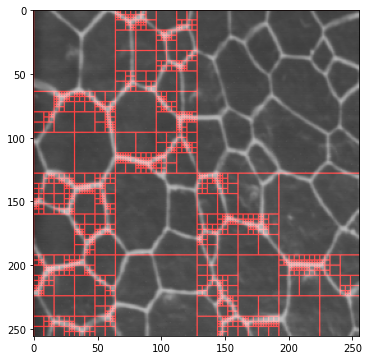

Threshold :  25.0
Number of regions :  1135


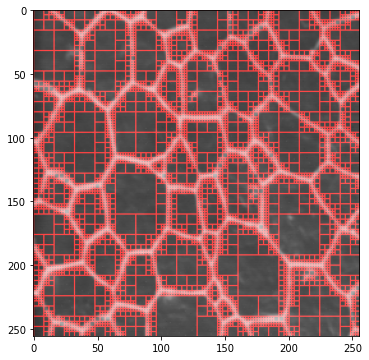

Threshold :  12.5
Number of regions :  5560


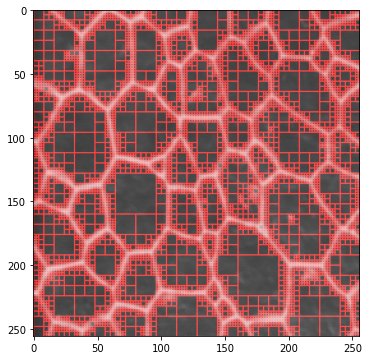

Threshold :  6.25
Number of regions :  6892


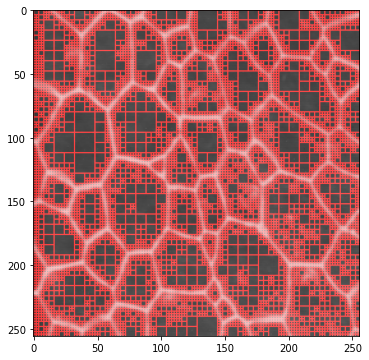

Threshold :  3.125
Number of regions :  9079


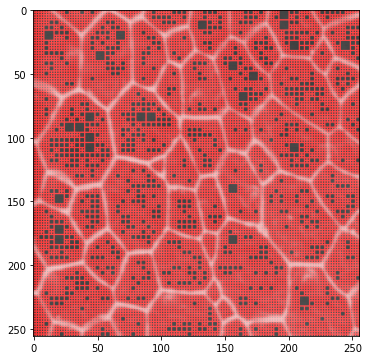

Threshold :  1.5625
Number of regions :  13711


In [59]:
# prisme
thresholdTest(prisme)

**Here shapes roughly have the same value, and the borders are quite thin, which could explain why, with a threshold of 25, prisms are not well discriminated.**  
Thus, threshold around 12.5 is required

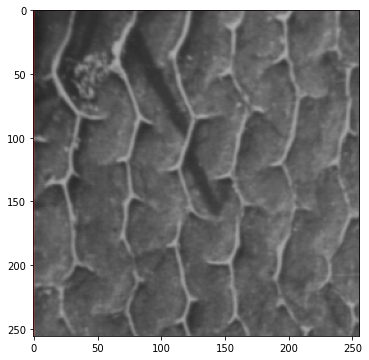

Threshold :  100
Number of regions :  1


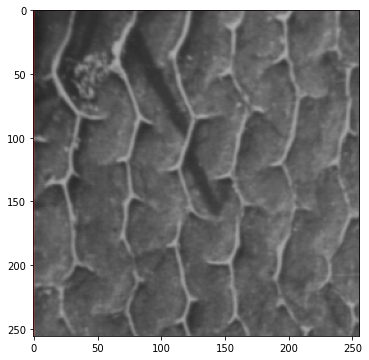

Threshold :  50.0
Number of regions :  1


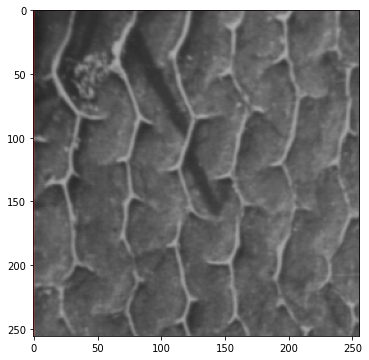

Threshold :  25.0
Number of regions :  1


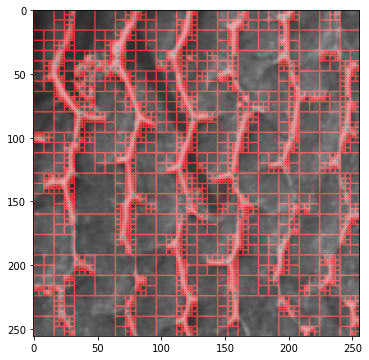

Threshold :  12.5
Number of regions :  3241


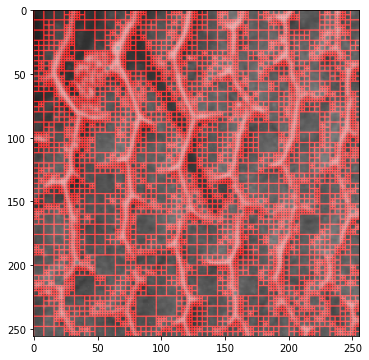

Threshold :  6.25
Number of regions :  7255


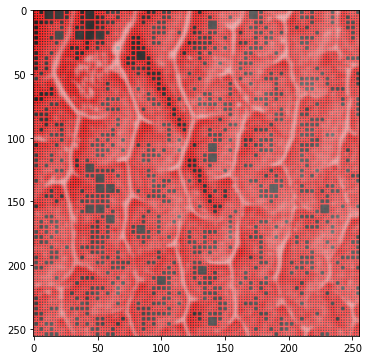

Threshold :  3.125
Number of regions :  13333


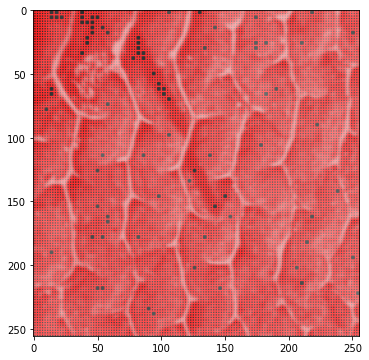

Threshold :  1.5625
Number of regions :  16135


In [60]:
# seiche
thresholdTest(seiche)

**Same remark here than for the previous one, we see that threshols between 12 and 6 are enough but that 25 is too high**

## Exercise 3
### Question 1
Modify the function ``listRegions(L)`` to make it a function ``listRegionsStat(L,I)`` which computes the list of leaves of the quadtree ``L``. Each element of this list will be enriched with three scalar values: the first being the size, the second the mean and the third the variance of pixel values of the block in the image ``I``. This function then returns a list whose elements have the following formal type:
```python
type BlockStat = tuple[int**4,int,float**2]
```

The first four values are those of the ``Block`` type, the fifth is the size of the block (in number of pixels) and the last two values are the mean and variance calculated over the region.

In [47]:
# type BlockStat = tuple[int**4,int,float**2]

def listRegionsStat(Qt,I):
    """ QuadTree*Array -> list[BlockStat] """
    L = []
    if len(Qt) == 1:
        x,y,n,m = Qt[0]
        correspondingWindow = I[x:x+n, y:y+m]
        region = (x, y, n, m, correspondingWindow.size, correspondingWindow.mean(), correspondingWindow.var())
        return([region])
    else:
        for node in Qt:
            L += listRegionsStat(node,I)
    return L

### Question 2
In the remainder, the formal type is considered:
```python
type Region = list[BlocStats]
```
A region, as seen during the tutorial work, is therefore a list of blocks. Write the predicate ``predmerge(b,R,*args)`` as seen in tutorial work. This function returns ``True`` if the ``b`` block should merge into the ``R`` region. If a merge happens, then the first item of ``R`` will have its statistics updated to describe the statistics of the region ``R`` merged with `b`.

In [48]:
def predmerge(b,R,*args):
    """ BlocsStat*Region*... -> bool 
        If merge, R[0] is modified
    """
    
    if b in R: return False;
    
    #getting old value
    x,y,w,h, size, mub,sigmab = b
    xr,yr,wr,hr, sizer, mur,sigmar = R[0]
    
    #new size
    n = size + sizer
    
    #new mu
    mu = (size*mub + sizer*mub)/n
    
    #new sigma
    sigma = 1/n * (size*(sigmab**2+mub**2) + sizer*(sigmar**2+mur**2))-mu**2
    
    if sigma < args[0]:
        R[0] = xr,yr,wr,hr, n, mu, sigma
        return True
    return False

### Question 3
Using `predmerge()` and `neighbors()` functions, given at the beginning of the notebook, write the function ``merge()`` discussed in tutorial work (exercise 7.6).

Recalls on Python lists:
- Remove an element `a` from a list `L`: `L.remove(a)`
- Test if `a` belongs to a list `L`: `a in L` 
- Iterate the elements of a list `L`: `for a in L:`
- Access to an element of a list: as with numpy arrays

In [49]:
def merge(Qt,I,predmerge,*args):
    """ QuadTree*Array*(BlockStat*Region*...->bool) -> list[Region]
        Merge the leaves of S in a list of regions
    """
    K = listRegionsStat(Qt,I)
    L = []
    while K: 
        b = K.pop(0)
        R = [b]
        N = neighbors(b,K)
        for bn in N:
            if predmerge(bn,R,*args):
                K.remove(bn)
                R += [bn]
                N += [i for i in neighbors(bn,K) if i not in N]
        L.append(R)
    return L
                
        

### Question 4
Test the previous functions using the synthetic image `img_test`. In particular, check that merge() returns a list of 3 elements (i.e. 3 regions).

In [19]:
QT = split(img_test,(0,0,int(img_test.shape[0]),int(img_test.shape[1])),10)
M = merge(QT,img_test, predmerge, 10)
assert len(M) == 3

### Question 5
Write a function ``regions(LR,shape)`` that takes as arguments a list of regions (such as returned by the function ``merge()``) and an image size, and returns an image of the regions. Each region will be colored with the gray level corresponding to the average of the region. The ``shape`` parameter gives the size of the image to be produced. 

Test the function on the previous example.

In [50]:
def regions(LR,shape):
    """ list[Region]*tuple[int,int] -> Array """
    img = np.zeros(shape)
    for R in LR:
        mean = 0
        for r in R: 
            mean += r[5]
        mean /= len(R)
        for r in R:
            img[r[0]:r[0]+r[2],r[1]:r[1]+r[3]] = mean
    return img

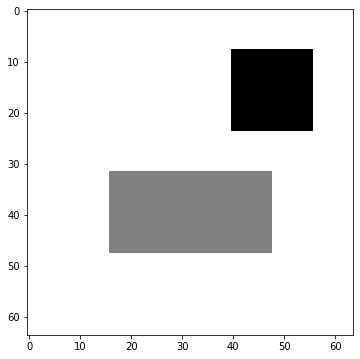

In [21]:
imshow(regions(M, img_test.shape))

**We do find back our two rectangular shapes and the white background**

## Exercise 4: experiments
### Question 1
Test the function ``merge()`` on the images ``angio``, ``cam``, ``muscle``, ``prisme`` and ``seiche``. Try to produce the best segmentations.

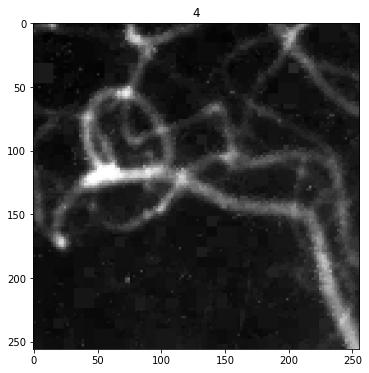

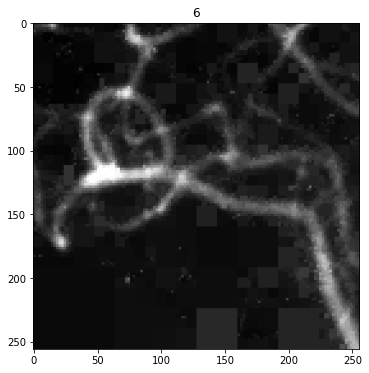

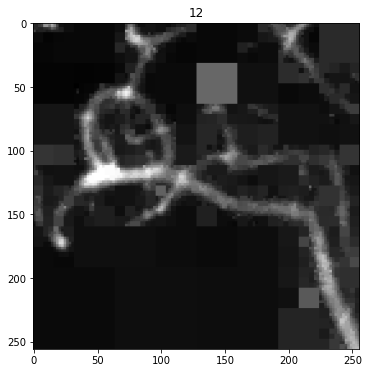

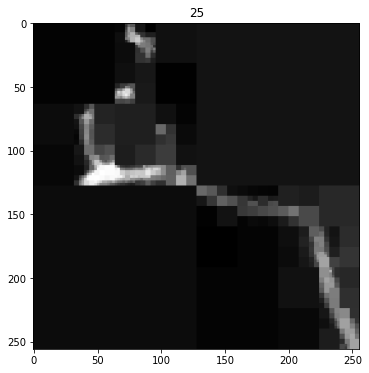

In [77]:
# ANGIO

R = (0,0, int(angio.shape[0]), int(angio.shape[1]))
for s in [4,6,12,25]:
    QT = split(angio,R,s)
    M = merge(QT,angio,predmerge, s)
    imshow(regions(M, angio.shape), title=s)

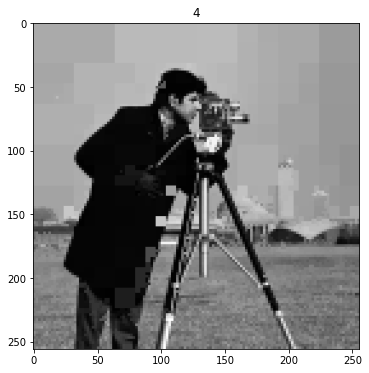

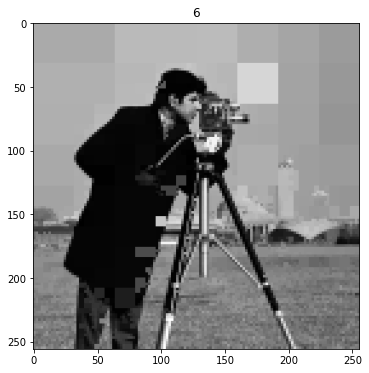

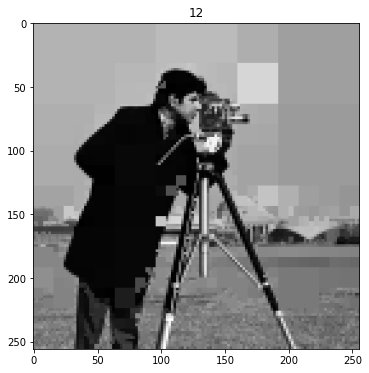

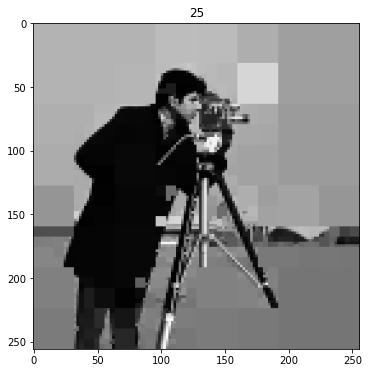

In [78]:
# CAM

R = (0,0, int(cam.shape[0]), int(cam.shape[1]))
for s in [4,6,12,25]:
    QT = split(cam,R,s)
    M = merge(QT,cam,predmerge, s)
    imshow(regions(M, cam.shape), title=s)

**As we previously said, high threshold value are enough to get the silouhette but not to get buildings in the background. It all depends on what we want to accomplish with the merging algorithm.**

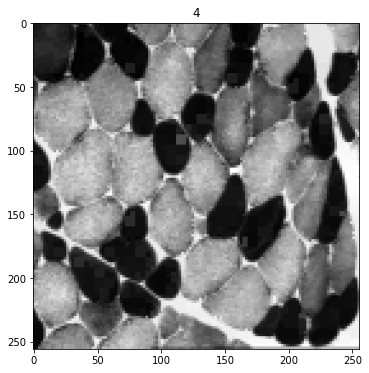

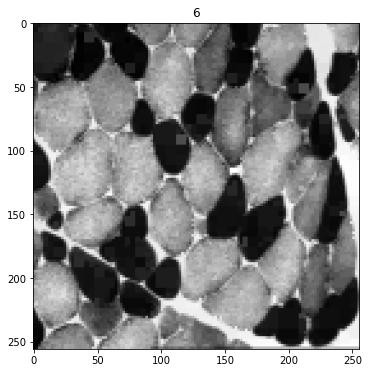

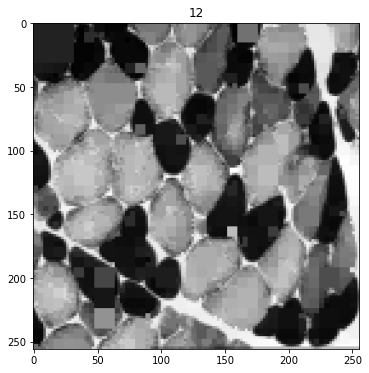

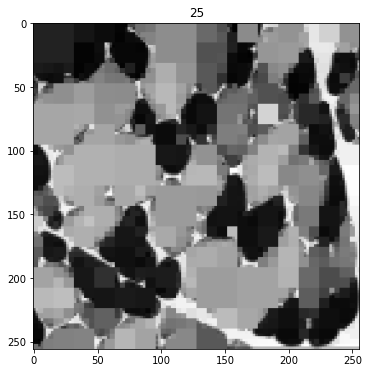

In [79]:
# MUSCLE

R = (0,0, int(muscle.shape[0]), int(muscle.shape[1]))
for s in [4,6,12,25]:
    QT = split(muscle,R,s)
    M = merge(QT,muscle, predmerge, s)
    imshow(regions(M, muscle.shape), title=s)

We'll try again with threshold values between 25 and 12.

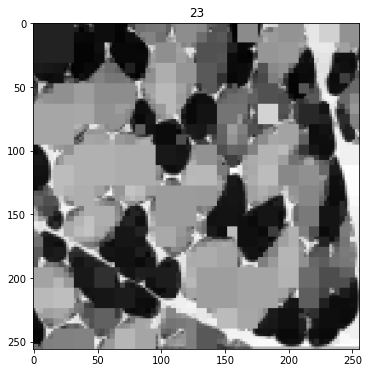

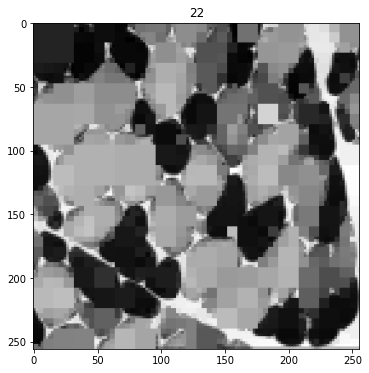

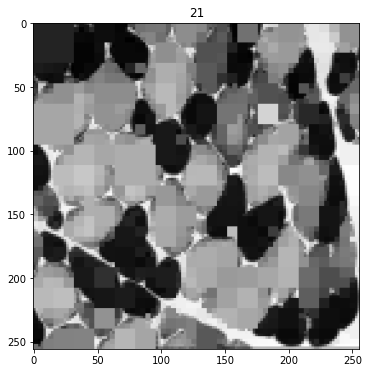

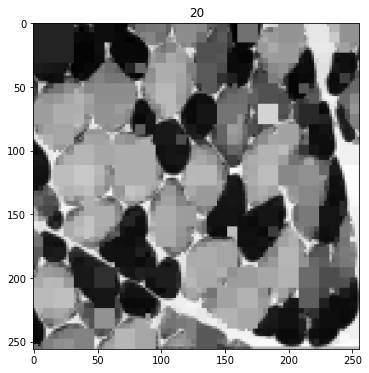

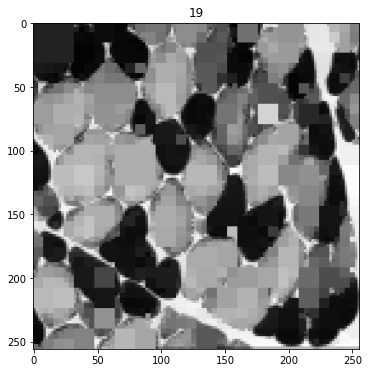

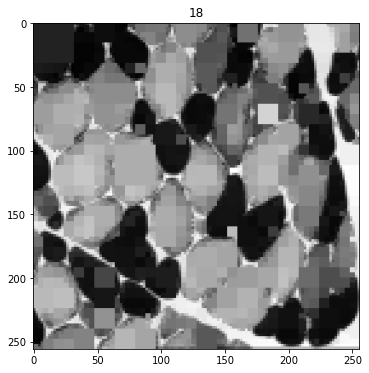

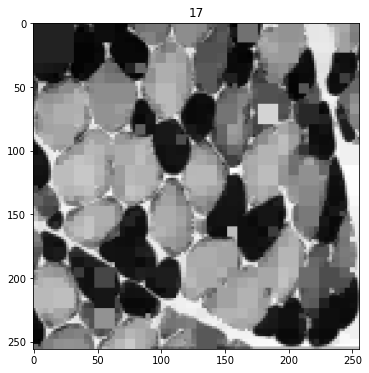

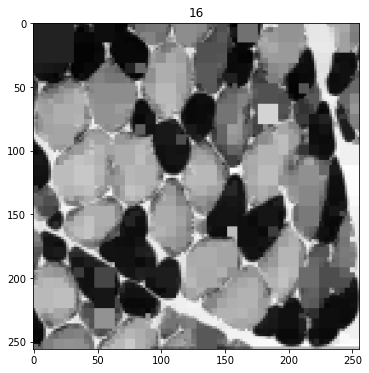

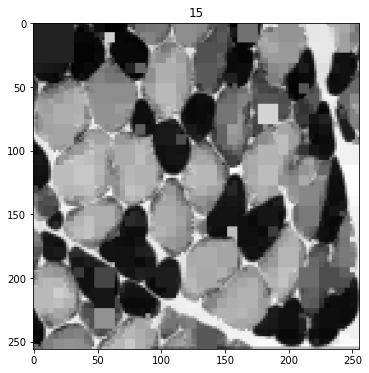

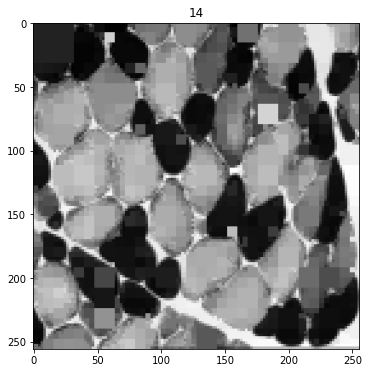

In [80]:
R = (0,0, int(muscle.shape[0]), int(muscle.shape[1]))
for s in range(23,13,-1):
    QT = split(muscle,R,s)
    M = merge(QT,muscle, predmerge, s)
    imshow(regions(M, muscle.shape), title=s)

**Assuming we want to be able to discriminate the cells, we can merge with a threshold as high as 20, although we have some odd means, probably due to the merging order. This picture would a great candidate for further testing.**

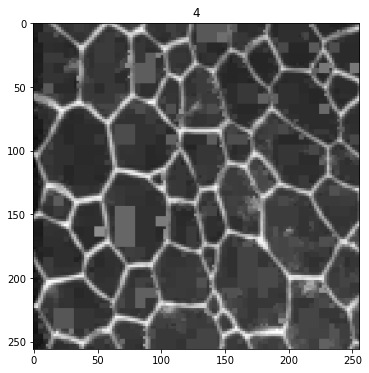

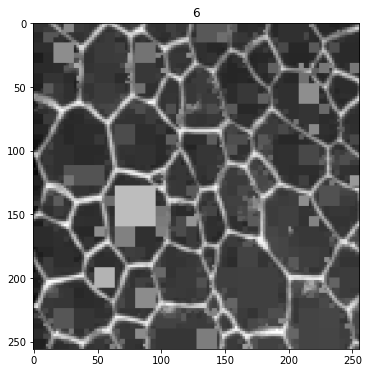

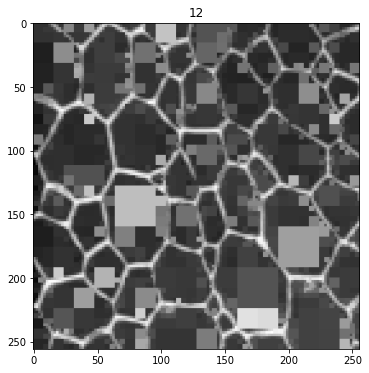

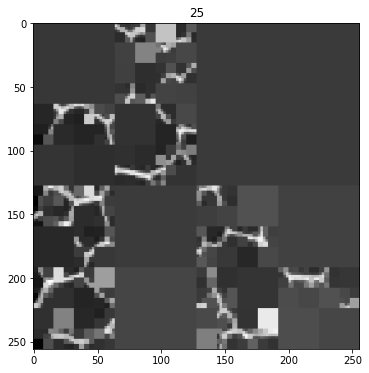

In [81]:
# PRISME

R = (0,0, int(prisme.shape[0]), int(prisme.shape[1]))
for s in [4,6,12,25]:
    QT = split(prisme,R,s)
    M = merge(QT,prisme, predmerge, s)
    imshow(regions(M, prisme.shape), title=s)

Ideally, we'd want all regions to be merge according to the prism shape. We see that with s=25, it overlaps the shapes so we'll try again wtih threshold values between 25 and 12.

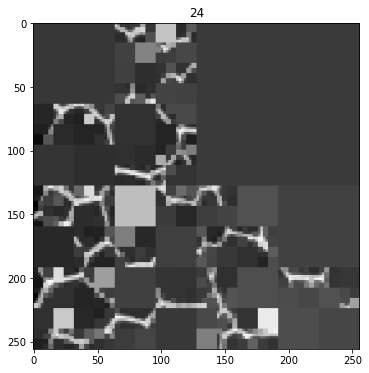

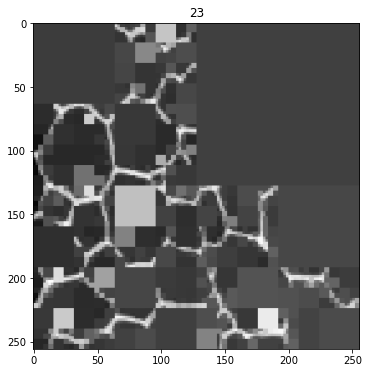

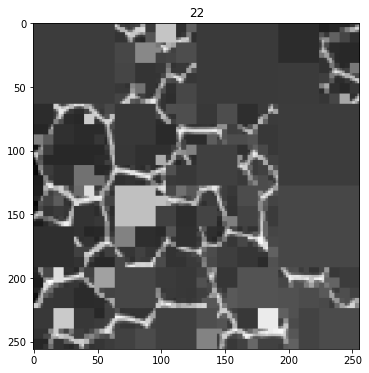

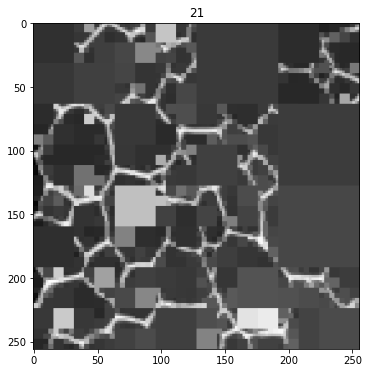

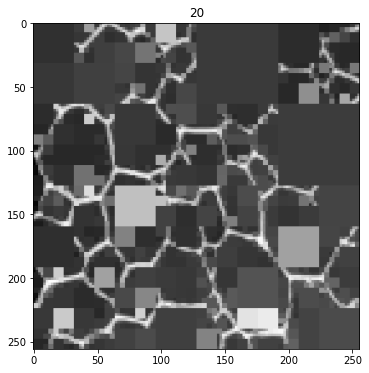

...

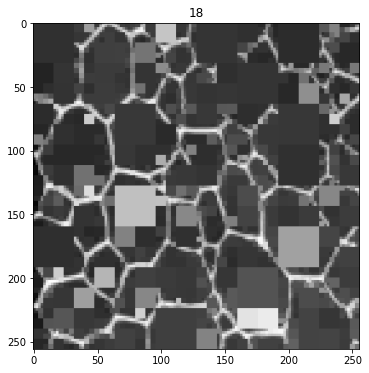

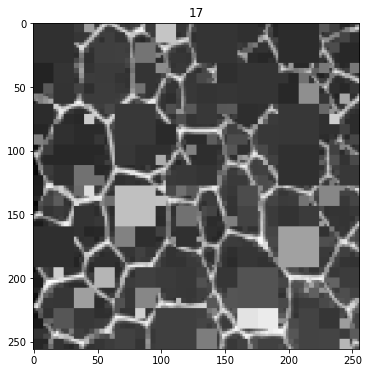

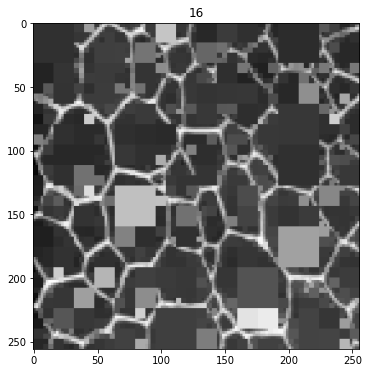

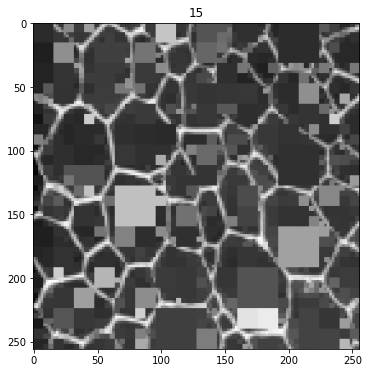

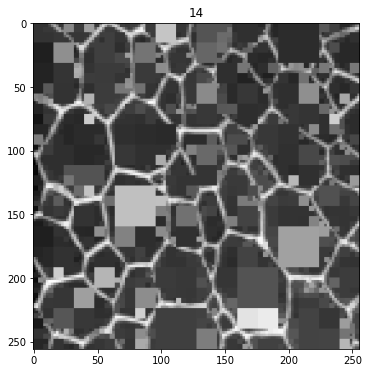

In [82]:
R = (0,0, int(prisme.shape[0]), int(prisme.shape[1]))
for s in range(24,13, -1):
    QT = split(prisme,R,s)
    M = merge(QT,prisme, predmerge, s)
    imshow(regions(M, prisme.shape), title=s)

**If we want to preserve the white edges, we can't go above 14. We also notice that the greater regions have wrong means compared to the original image, this might be due to the merge order of small regions. This picture would be a great candidate for later experiments on sorted regions and neighbors.**

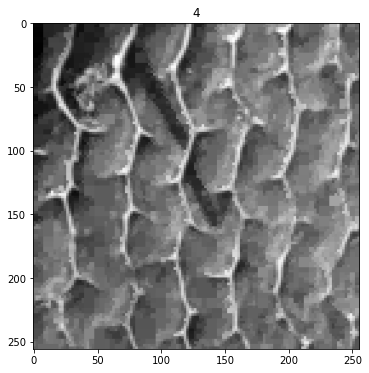

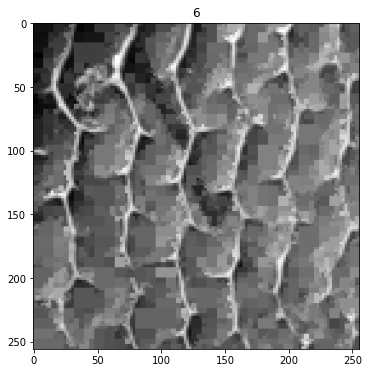

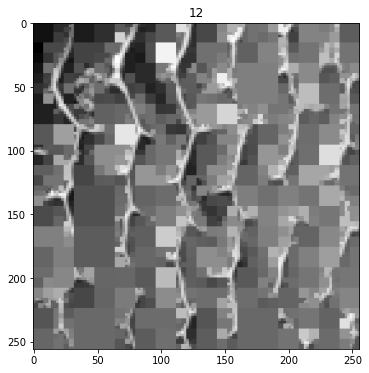

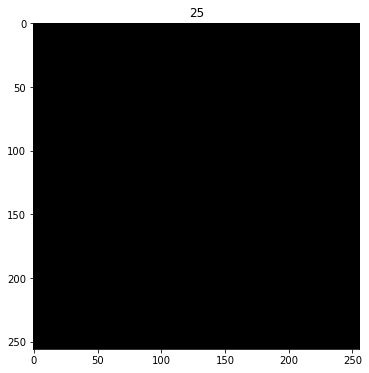

In [83]:
# SEICHE

R = (0,0, int(seiche.shape[0]), int(seiche.shape[1]))
for s in [4,6,12,25]:
    QT = split(seiche,R,s)
    M = merge(QT,seiche, predmerge, s)
    imshow(regions(M, seiche.shape), title=s)

### Question 2
The result of the merge algorithm highly depends on how you visit the regions. One can then sort the leaves of the quadtree, for example, from the smallest to the largest blocks, or the opposite (use the Python function ``sorted()``). 
The same question arises when calculating the set of neighbors of the merged region. Should they be sorted? If yes, according to which criteria? their size? their proximity? 
Obviously there is no universal answer but it should be adapted to each type of problem. 
Do some tests to see the influence of these sortings on the result of the merger.

**As we said above, `prism` and `muscle` seem to be great candidates for this kind of testing.**

In [65]:
def mergeBigFirst(Qt,I, predmerge, *args):
    """ QuadTree*Array*(BlockStat*Region*...->bool) -> list[Region]
        Merge the leaves of S in a list of regions
    """
    K = listRegionsStat(Qt,I)
    K.sort(key=lambda R:R[4], reverse=True)
    L = []
    while K: 
        b = K.pop(0)
        R = [b]
        N = neighbors(b,K)
        for bn in N:
            if predmerge(bn,R,*args):
                K.remove(bn)
                R += [bn]
                N += [i for i in neighbors(bn,K) if i not in N]
        L.append(R)
    return L

In [66]:
def mergeSmallFirst(Qt,I, predmerge, *args):
    """ QuadTree*Array*(BlockStat*Region*...->bool) -> list[Region]
        Merge the leaves of S in a list of regions
    """
    K = listRegionsStat(Qt,I)
    K.sort(key=lambda R:R[4])
    L = []
    while K: 
        b = K.pop(0)
        R = [b]
        N = neighbors(b,K)
        for bn in N:
            if predmerge(bn,R,*args):
                K.remove(bn)
                R += [bn]
                N += [i for i in neighbors(bn,K) if i not in N]
        L.append(R)
    return L

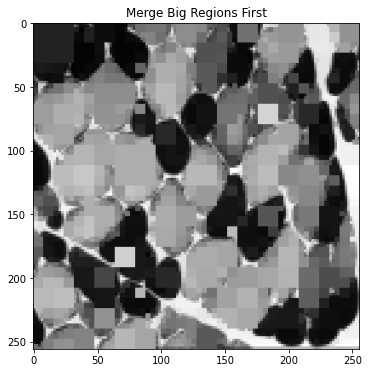

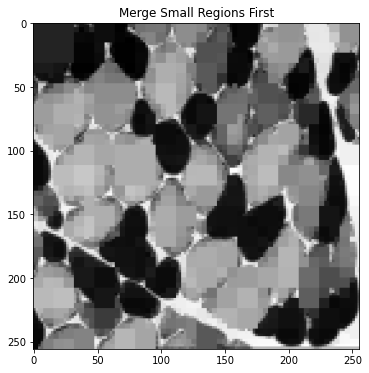

In [84]:
# MUSCLE
s = 20
R = (0,0, int(muscle.shape[0]), int(muscle.shape[1]))
QT = split(muscle,R,s)
M = mergeBigFirst(QT,muscle, predmerge, s)
imshow(regions(M, muscle.shape), title='Merge Big Regions First')
QT = split(muscle,R,s)
M = mergeSmallFirst(QT,muscle, predmerge, s)
imshow(regions(M, muscle.shape), title='Merge Small Regions First')

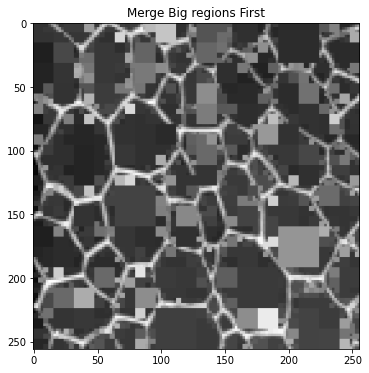

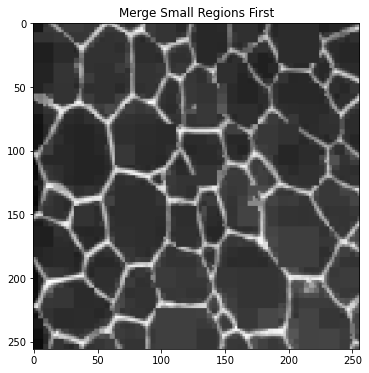

In [85]:
# PRISME
s = 14
R = (0,0, int(prisme.shape[0]), int(prisme.shape[1]))
QT = split(prisme,R,s)
M = mergeBigFirst(QT,prisme, predmerge, s)
imshow(regions(M, prisme.shape), title='Merge Big regions First')
M = mergeSmallFirst(QT, prisme, predmerge, s)
imshow(regions(M, prisme.shape), title='Merge Small Regions First')


**For both images, we see than merging small-size regions first produce a much more precise result with higher fidelity to original gray levels.**

Let's try the same comparison with other images : 

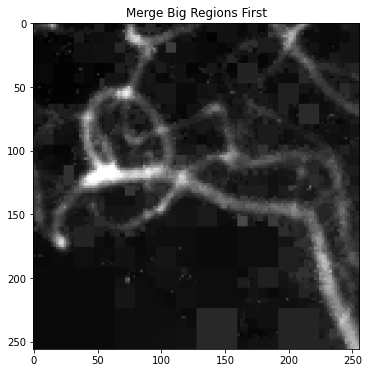

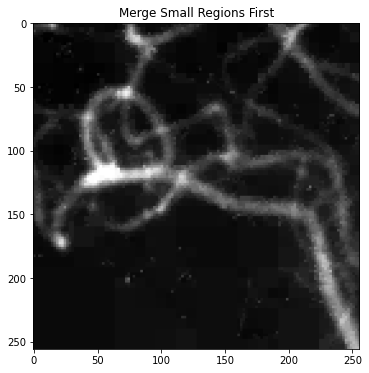

In [86]:
# ANGIO
R = (0,0, int(angio.shape[0]), int(angio.shape[1]))
s = 6
QT = split(angio,R,s)
M = mergeBigFirst(QT,angio, predmerge, s)
imshow(regions(M, angio.shape), title="Merge Big Regions First")
QT = split(angio,R,s)
M = mergeSmallFirst(QT,angio, predmerge, s)
imshow(regions(M, angio.shape), title="Merge Small Regions First")


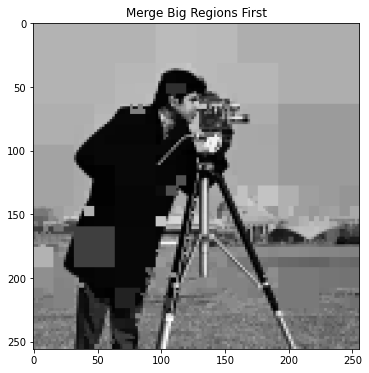

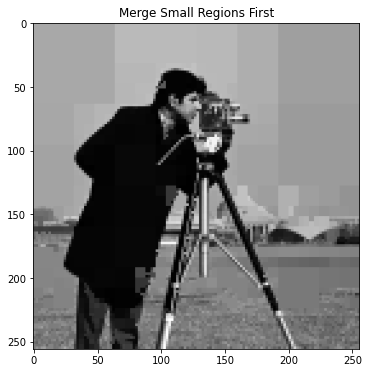

In [87]:
# CAM
s = 12
R = (0,0, int(cam.shape[0]), int(cam.shape[1]))
QT = split(cam,R,s)
M = mergeBigFirst(QT,cam, predmerge, s)
imshow(regions(M, cam.shape), title='Merge Big Regions First')
QT = split(cam,R,s)
M = mergeSmallFirst(QT,cam, predmerge, s)
imshow(regions(M, cam.shape), title='Merge Small Regions First')


**This sorting appears to fit to these images although we still have that merging large regions first produces a worst result.**

### Question 3 (bonus)
Imagine and experiment alternative predicates for both the split and the merge steps. It is possible to use edges-based predicates, and also to combine with variance-based predicates.


**We can try and split the image using the sobel detector we implemented two weeks ago, then merge using the real image.**

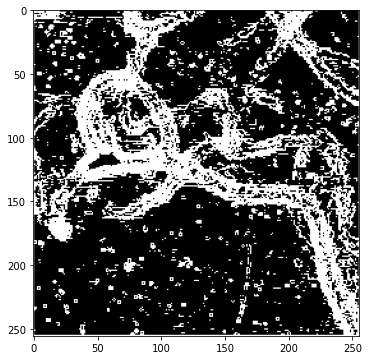

In [71]:
angioEdges = SobelDetector(angio, 50)
imshow(angioEdges)

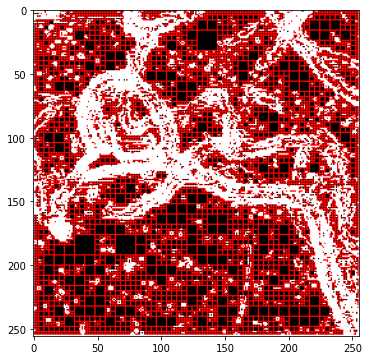

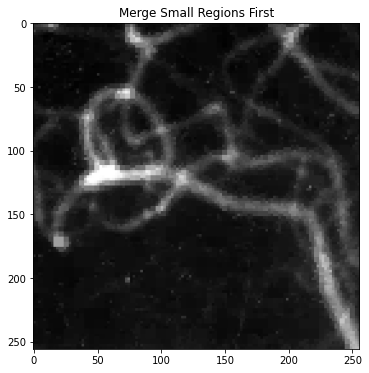

In [73]:
# ANGIO
R = (0,0, int(angio.shape[0]), int(angio.shape[1]))
s = 12
QT = split(angioEdges,R,s)
imshow(drawRegions(listRegions(QT),angioEdges))
M = mergeSmallFirst(QT,angio, predmerge, s)
imshow(regions(M, angio.shape), title="Merge Small Regions First")

And we see it produces a nice result even with a threshold value twice as high as the one we used just above  
**Let's try these steps for other images**

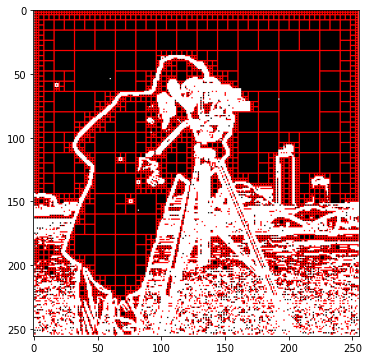

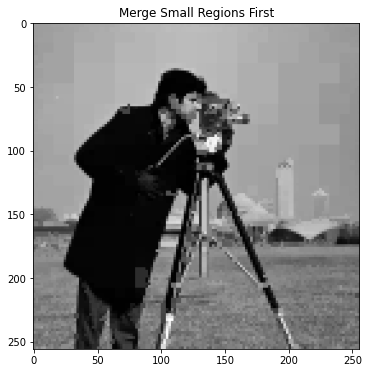

In [77]:
# CAM
camEdges = SobelDetector(cam, 50)
R = (0,0, int(cam.shape[0]), int(cam.shape[1]))
s = 20
QT = split(camEdges,R,s)
imshow(drawRegions(listRegions(QT),camEdges))
M = mergeSmallFirst(QT,cam, predmerge, s)
imshow(regions(M, cam.shape), title="Merge Small Regions First")

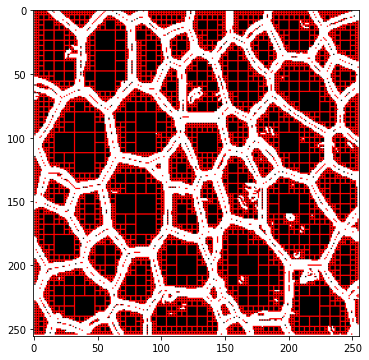

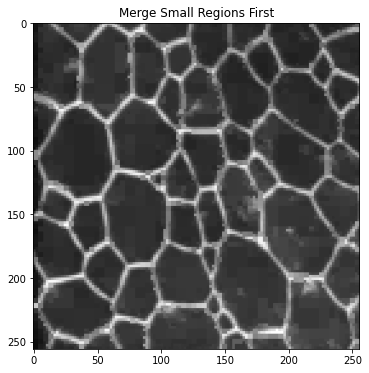

In [79]:
# PRISM
prismeEdges = SobelDetector(prisme, 50)
R = (0,0, int(prisme.shape[0]), int(prisme.shape[1]))
s = 14
QT = split(prismeEdges,R,s)
imshow(drawRegions(listRegions(QT),prismeEdges))
M = mergeSmallFirst(QT,prisme, predmerge, s)
imshow(regions(M, prisme.shape), title="Merge Small Regions First")

**Of course this would require more testing - using different threshold values for sobel and merging and splitting predicates - but we can already see that splitting according to edge detection improves a lot the readability of the final split-merged image. In fact, with the right set of tools and parameters, we see that we can discriminate shapes that matter, and merge what is of no interest in the image to only keep the key parts.**

In [73]:
def predmerge_std(b,R,*args):
    """ BlocsStat*Region*... -> bool 
        If merge, R[0] is modified
    """
    
    if b in R: return False;
    
    #getting old value
    x,y,w,h, size, mub,sigmab = b
    xr,yr,wr,hr, sizer, mur,sigmar = R[0]
    
    #new size
    n = size + sizer
    
    #new mu
    mu = (size*mub + sizer*mub)/n
    
    #new sigma
    sigma = 1/n * (size*(sigmab**2+mub**2) + sizer*(sigmar**2+mur**2))-mu**2
    
    if np.sqrt(sigma) < args[0]:
        R[0] = xr,yr,wr,hr, n, mu, sigma
        return True
    return False

In [62]:
def predmerge_mean(b,R,*args):
    """ BlocsStat*Region*... -> bool 
        If merge, R[0] is modified
    """
    
    if b in R: return False;
    
    #getting old value
    x,y,w,h, size, mub,sigmab = b
    xr,yr,wr,hr, sizer, mur,sigmar = R[0]
    
    #new size
    n = size + sizer
    
    #new mu
    mu = (size*mub + sizer*mub)/n
    
    #new sigma
    sigma = 1/n * (size*(sigmab**2+mub**2) + sizer*(sigmar**2+mur**2))-mu**2
    
    if np.abs(mu - mur) < args[0]:
        R[0] = xr,yr,wr,hr, n, mu, sigma
        return True
    return False

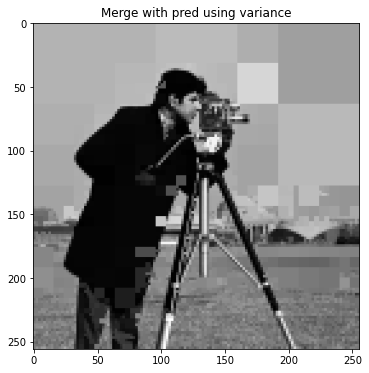

<ipython-input-62-57f98e2972d3>:19: RuntimeWarning: overflow encountered in double_scalars
  sigma = 1/n * (size*(sigmab**2+mub**2) + sizer*(sigmar**2+mur**2))-mu**2


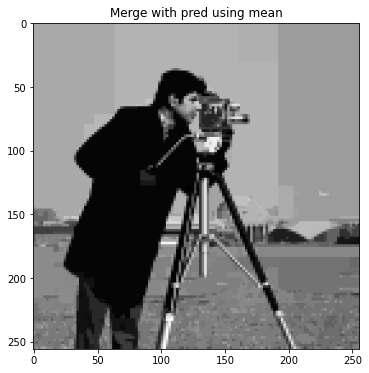

<ipython-input-73-903bfd2c942b>:21: RuntimeWarning: invalid value encountered in sqrt
  if np.sqrt(sigma) < args[0]:


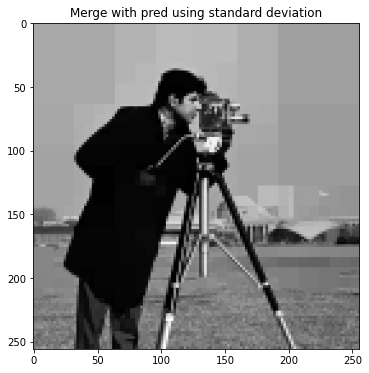

In [75]:
QT = split(cam,(0,0,int(cam.shape[0]),int(cam.shape[1])),10)
# imshow(drawRegions(listRegions(QT),cam))
M = merge(QT,cam, predmerge, 10)
imshow(regions(M, cam.shape), title="Merge with pred using variance")
M = merge(QT,cam, predmerge_mean, 10)
imshow(regions(M, cam.shape), title="Merge with pred using mean")
M = merge(QT,cam, predmerge_std, 10)
imshow(regions(M, cam.shape), title="Merge with pred using standard deviation")

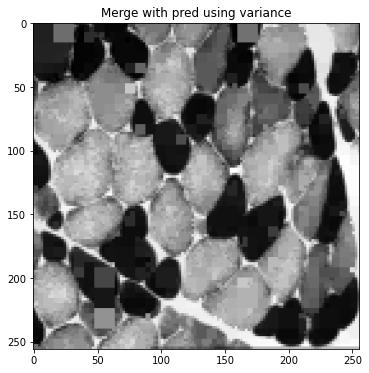

<ipython-input-62-57f98e2972d3>:19: RuntimeWarning: overflow encountered in double_scalars
  sigma = 1/n * (size*(sigmab**2+mub**2) + sizer*(sigmar**2+mur**2))-mu**2


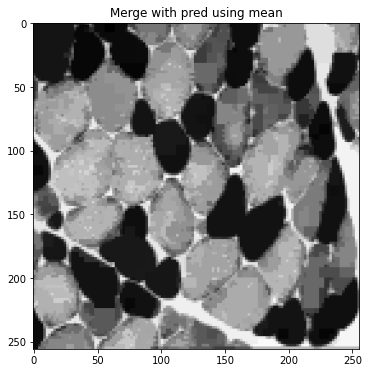

<ipython-input-73-903bfd2c942b>:21: RuntimeWarning: invalid value encountered in sqrt
  if np.sqrt(sigma) < args[0]:


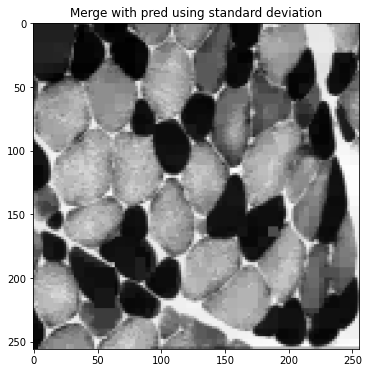

In [76]:
QT = split(muscle,(0,0,int(cam.shape[0]),int(cam.shape[1])),10)
# imshow(drawRegions(listRegions(QT),cam))
M = merge(QT,muscle, predmerge, 10)
imshow(regions(M, muscle.shape), title="Merge with pred using variance")
M = merge(QT,muscle, predmerge_mean, 10)
imshow(regions(M, muscle.shape), title="Merge with pred using mean")
M = merge(QT,muscle, predmerge_std, 10)
imshow(regions(M, muscle.shape), title="Merge with pred using standard deviation")

**As we can see, using the difference between the means seems to give a smooter image than using the variance or the standard deviation. Their is less isolates regions.**
**Let's try to use the merge on the smaller regions first**

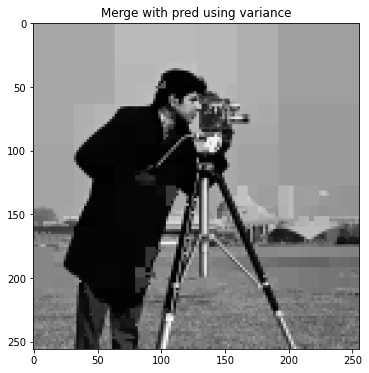

<ipython-input-62-57f98e2972d3>:19: RuntimeWarning: overflow encountered in double_scalars
  sigma = 1/n * (size*(sigmab**2+mub**2) + sizer*(sigmar**2+mur**2))-mu**2


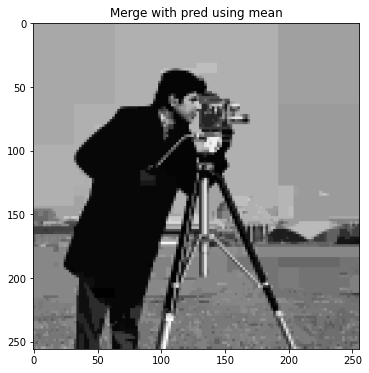

In [71]:
QT = split(cam,(0,0,int(cam.shape[0]),int(cam.shape[1])),10)
# imshow(drawRegions(listRegions(QT),cam))
M = mergeSmallFirst(QT,cam, predmerge, 10)
imshow(regions(M, cam.shape), title="Merge with pred using variance")
M = mergeSmallFirst(QT,cam, predmerge_mean, 10)
imshow(regions(M, cam.shape), title="Merge with pred using mean")

**The difference by merging small region first is not as obvious as the difference between the mean predicat and variance predicat. The mean is still a better predicat though**